In [52]:
### além dos slides e do livro, há um conjunto de dicas aqui: https://caiquecoelho.medium.com/um-guia-completo-para-o-pr%C3%A9-processamento-de-dados-em-machine-learning-f860fbadabe1

In [53]:
# random.seed(3) # Semente para random
# print(random.randint(1, 1000))

In [54]:
import pandas as pd
import numpy as np

In [55]:
import plotly.express as px
from sklearn import preprocessing
from sklearn.model_selection import train_test_split

In [56]:
data = pd.read_csv('diabetes.csv', delimiter=",")


In [57]:
data.head()

,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
0,Female,80.0,0,1,never,25.19,6.6,140,0
1,Female,54.0,0,0,No Info,27.32,6.6,80,0
2,Male,28.0,0,0,never,27.32,5.7,158,0
3,Female,36.0,0,0,current,23.45,5.0,155,0
4,Male,76.0,1,1,current,20.14,4.8,155,0


In [58]:
print('Valores Faltantes:\n',data.isnull().sum())


Valores Faltantes:
 gender                 0
age                    0
hypertension           0
heart_disease          0
smoking_history        0
bmi                    0
HbA1c_level            0
blood_glucose_level    0
diabetes               0
dtype: int64


In [59]:
#print('registros duplicados\n', data.duplicated())
print('Total de Registros Duplicados: ', data.duplicated().sum())

Total de Registros Duplicados:  3854


In [60]:
## Eliminando Dados:

In [61]:
data.drop_duplicates(inplace=True)

In [62]:
# Lembrar de checar se há diagnosticos distintos para um mesmo conjunto de atributos de entrada

In [63]:
print(data.columns)

Index(['gender', 'age', 'hypertension', 'heart_disease', 'smoking_history',
       'bmi', 'HbA1c_level', 'blood_glucose_level', 'diabetes'],
      dtype='object')


In [64]:
data.duplicated(subset=['gender', 'age', 'hypertension', 'heart_disease', 'smoking_history',
       'bmi', 'HbA1c_level', 'blood_glucose_level'],keep=False).value_counts()

False    95964
True       182
dtype: int64

In [65]:
data.drop_duplicates(subset=['gender', 'age', 'hypertension', 'heart_disease', 'smoking_history',
       'bmi', 'HbA1c_level', 'blood_glucose_level'],keep=False,inplace=True)

In [66]:
data.describe()

,age,hypertension,heart_disease,bmi,HbA1c_level,blood_glucose_level,diabetes
count,95964.000000,95964.000000,95964.000000,95964.000000,95964.000000,95964.000000,95964.000000
mean,41.754817,0.077685,0.040880,27.321464,5.531516,138.193072,0.087439
std,22.456404,0.267677,0.198013,6.774130,1.073874,40.935124,0.282479
min,0.080000,0.000000,0.000000,10.010000,3.500000,80.000000,0.000000
25%,24.000000,0.000000,0.000000,23.390000,4.800000,100.000000,0.000000
50%,43.000000,0.000000,0.000000,27.320000,5.800000,140.000000,0.000000
75%,59.000000,0.000000,0.000000,29.870000,6.200000,159.000000,0.000000
max,80.000000,1.000000,1.000000,95.690000,9.000000,300.000000,1.000000


95964


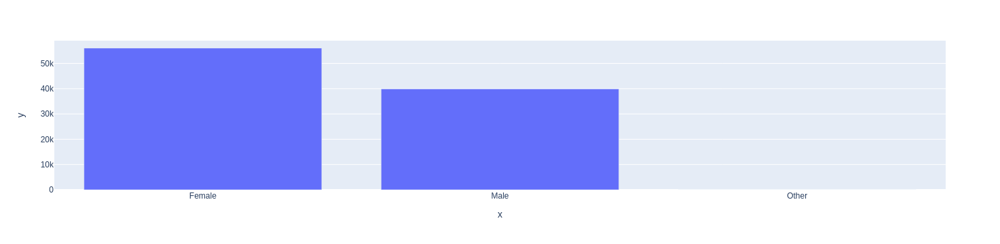

Female    56045
Male      39901
Other        18
Name: gender, dtype: int64


Female    0.584021
Male      0.415791
Other     0.000188
Name: gender, dtype: float64

In [67]:
print(len(data))
x=data['gender'].value_counts()
fig = px.bar(x=x.index,y=x)
fig.show()
print(x)
x/len(data)

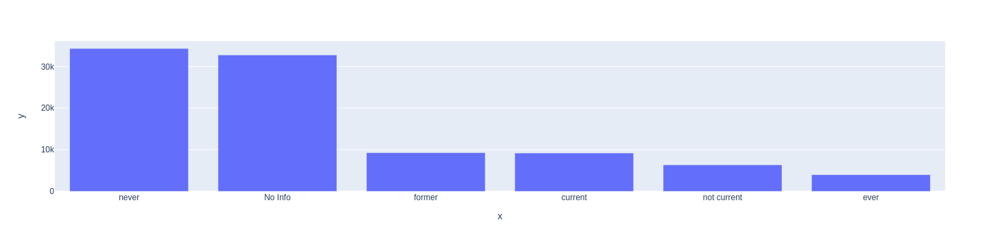

In [68]:
x=data['smoking_history'].value_counts()
fig = px.bar(y=x,x=x.index)
fig.show()


In [69]:
x/len(data)


never          0.357843
No Info        0.341618
former         0.096818
current        0.095775
not current    0.066285
ever           0.041661
Name: smoking_history, dtype: float64

In [70]:
data['gender']= data['gender'].map(lambda x: 0 if x == 'Female' else 1) # Transformando 'other' em male
y = lambda sym: {"never": 0, "No Info": 1, "current": 2, 'ever': 3, 'former':4, 'not current': 5}.get(sym)
data['smoking_history'] = data['smoking_history'].map(lambda x: y(x))

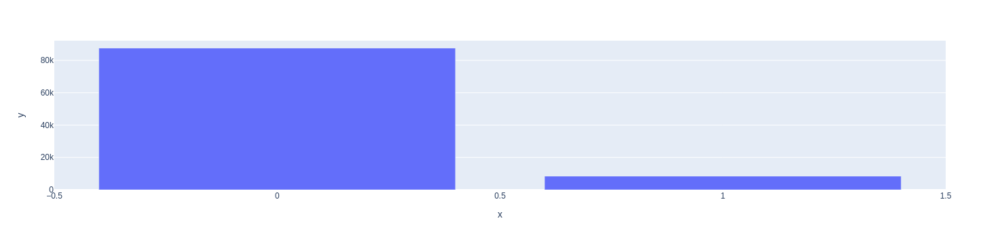

0    0.912561
1    0.087439
Name: diabetes, dtype: float64

In [71]:
x=data['diabetes'].value_counts()
fig = px.bar(x=x.index,y=x)
fig.show()
x/len(data)

In [72]:
data.loc[data['diabetes']==1].sample(n=4,random_state=25)

,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
23571,0,63.0,0,0,0,31.88,6.1,300,1
13784,1,57.0,1,0,2,33.90,6.5,126,1
61655,0,62.0,0,0,4,27.32,6.1,280,1
43928,0,71.0,1,0,0,47.40,6.5,200,1


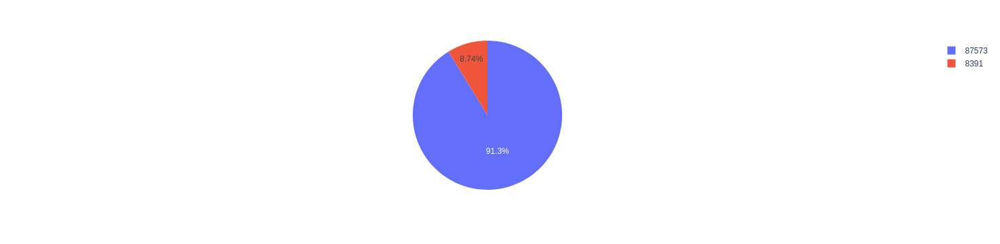

In [73]:
X=data.drop('diabetes', axis=1)
Y=data.diabetes
#Y.value_counts().plot.pie(autopct='%.2f') # 1 para diabético, 0 par não diabético
fig = px.pie(Y,values=Y.value_counts(),names=Y.value_counts())
fig.show()

# Fazendo a separação em treino e teste

In [74]:
X_train, X_test, Y_train, Y_test = train_test_split(X,Y, test_size=0.33, random_state=42, stratify=Y)

# Verificando a proporção na base de treino


In [75]:
Y_train.value_counts()/Y_train.shape[0]

0    0.912559
1    0.087441
Name: diabetes, dtype: float64

# Contando a quantidade de registros na base de treino

In [76]:
Y_train.value_counts()

0    58673
1     5622
Name: diabetes, dtype: int64

# Verificando a proporção na base de testes

In [77]:
Y_test.value_counts()/Y_test.shape[0]

0    0.912564
1    0.087436
Name: diabetes, dtype: float64

# Contando a quantidade de registros na base de

In [78]:
Y_test.value_counts()

0    28900
1     2769
Name: diabetes, dtype: int64

In [79]:
data2=data[(data["gender"]!='Male') & (data["gender"]!='Female')]
#print('registros com genero fora do intervalo possível\n', data2.head(len(data2)))
print('total de registros fora do intervalo previsto para genero: ', len(data2['gender']))

total de registros fora do intervalo previsto para genero:  95964


In [80]:
data.mean(numeric_only='true')


gender                   0.415979
age                     41.754817
hypertension             0.077685
heart_disease            0.040880
smoking_history          1.376850
bmi                     27.321464
HbA1c_level              5.531516
blood_glucose_level    138.193072
diabetes                 0.087439
dtype: float64

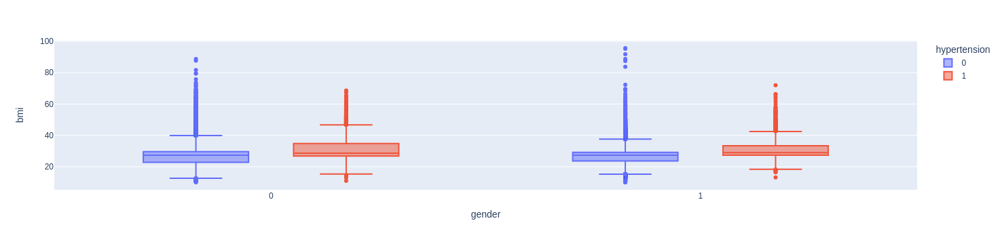

In [81]:
fig = px.box(data, x="gender",y="bmi", points="outliers", color="hypertension")
fig.show()

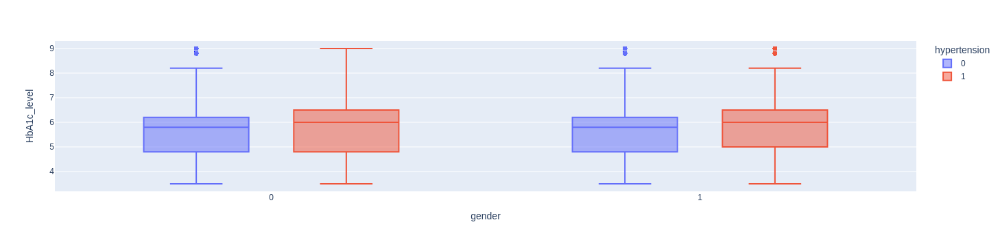

In [82]:
fig = px.box(data,x="gender",y="HbA1c_level", points="outliers", color="hypertension")
fig.show()

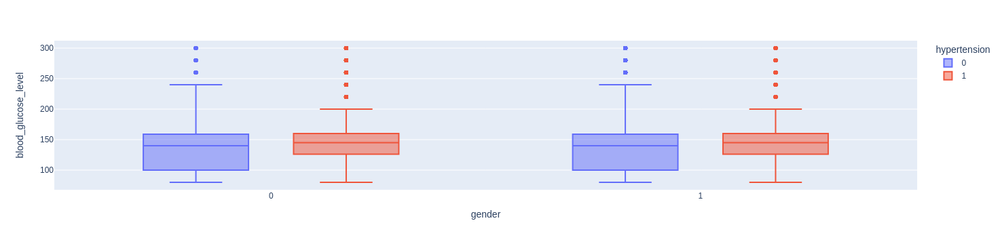

In [83]:
fig = px.box(data, x="gender",y="blood_glucose_level",points="outliers", color="hypertension")
fig.show()

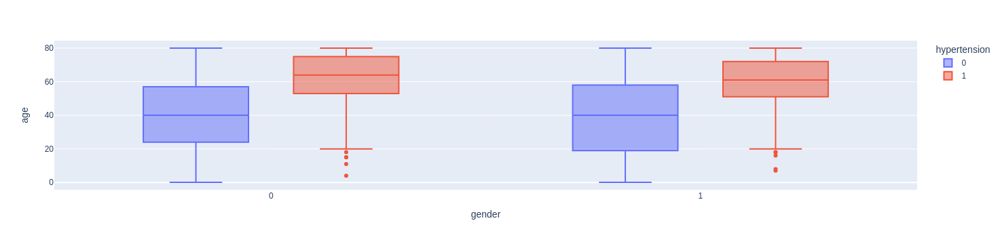

In [84]:
fig = px.box(data,x="gender",y="age", color="hypertension")
fig.show()

# moda: Valor encontrado com maior frequencia para um atributo


In [85]:
data['bmi'].mode() 

0    27.32
Name: bmi, dtype: float64

# Mediana: Ordena valores e pega o valor do meio ou média dos dois valores centrais.

In [86]:
data['bmi'].median()

27.32

In [87]:
data['bmi'].mean()

27.32146388228919

In [88]:
data['bmi'].var()

45.88884029213501

In [89]:
data['bmi'].std()

6.774130224031349

In [90]:
corr=data.corr(numeric_only='true')
corr.style.background_gradient(cmap='coolwarm')

,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
gender,1.000000,-0.028523,0.014286,0.078488,0.058279,-0.023505,0.020076,0.017896,0.038284
age,-0.028523,1.000000,0.257853,0.239120,0.174798,0.345224,0.105946,0.113822,0.264006
hypertension,0.014286,0.257853,1.000000,0.119975,0.040914,0.148177,0.081685,0.084983,0.197234
heart_disease,0.078488,0.239120,0.119975,1.000000,0.079546,0.061378,0.068376,0.070985,0.172138
smoking_history,0.058279,0.174798,0.040914,0.079546,1.000000,0.080898,0.027965,0.028613,0.069501
bmi,-0.023505,0.345224,0.148177,0.061378,0.080898,1.000000,0.084452,0.092573,0.216002
HbA1c_level,0.020076,0.105946,0.081685,0.068376,0.027965,0.084452,1.000000,0.171380,0.407088
blood_glucose_level,0.017896,0.113822,0.084983,0.070985,0.028613,0.092573,0.171380,1.000000,0.425690
diabetes,0.038284,0.264006,0.197234,0.172138,0.069501,0.216002,0.407088,0.425690,1.000000


<Axes: title={'center': 'correlação'}, xlabel='blood_glucose_level', ylabel='diabetes'>

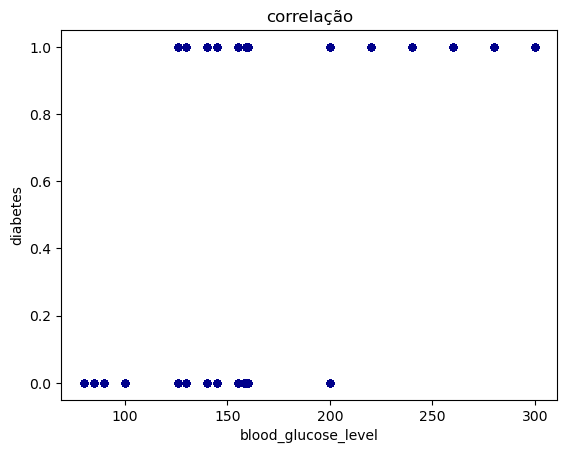

In [91]:
data.plot.scatter(y='diabetes', x='blood_glucose_level', title='correlação', c='DarkBlue')

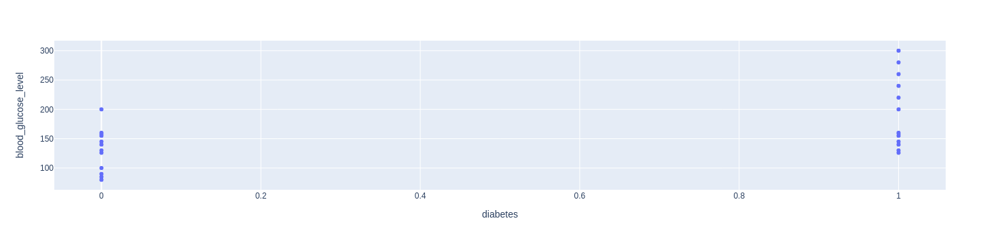

In [92]:
fig=px.scatter(data,x='diabetes', y='blood_glucose_level')
fig.show()

In [93]:
sum(i > 38.5 for i in data["bmi"])

5965

# importando regressão logística

# Definindo um classificador de regressão logistica

In [94]:
from sklearn.linear_model import LogisticRegression

In [95]:
clf=LogisticRegression(random_state=0, max_iter=500)

# Fazendo o fit dos dados

In [96]:
clf=clf.fit(X_train,Y_train)

# Previsão com os dados de teste

In [97]:
Y_pred=clf.predict(X_test)

# Avaliando modelo

In [98]:
from sklearn.metrics import accuracy_score

In [99]:
accuracy_score(Y_test, Y_pred)

0.9582557074741861

In [100]:
from sklearn.metrics import confusion_matrix

In [101]:
confusion_matrix(Y_test, Y_pred)

array([[28624,   276],
       [ 1046,  1723]])

# Calculando o recall

In [102]:
from sklearn.metrics import recall_score

In [103]:
recall_score(Y_test,Y_pred)

0.6222462983026363

## classificador arvore de decisão

In [104]:
from sklearn.tree import DecisionTreeClassifier

In [105]:
clfAD = DecisionTreeClassifier(random_state=0)

In [106]:
clfAD= clfAD.fit(X_train, Y_train)

In [107]:
Y_predAD = clfAD.predict(X_test)

In [108]:
confusion_matrix(Y_test, Y_predAD)

array([[28018,   882],
       [  693,  2076]])

In [109]:
recall_score(Y_test, Y_predAD)

0.7497291440953413

Balanceando o dataset
![title](under-over_sampling.png)

# Reduzindo a classe majoritária:

In [110]:
from imblearn.under_sampling import RandomUnderSampler

In [111]:
rus = RandomUnderSampler(random_state=42)
X_res, Y_res = rus.fit_resample(X_train, Y_train)

<Axes: ylabel='diabetes'>

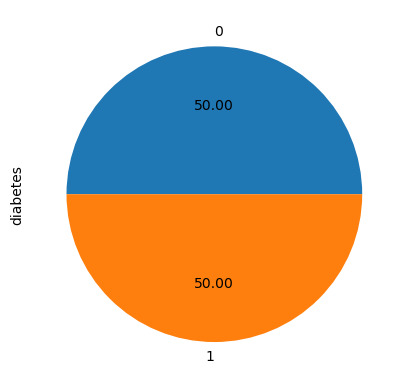

In [132]:
Y_res.value_counts().plot.pie(autopct='%.2f') # 1 para diabético, 0 par não diabético
#fig = px.pie(Y_res,values=Y_res.value_counts(),names=Y_res.value_counts())
#fig.show()

In [113]:
Y_res.value_counts()

0    5622
1    5622
Name: diabetes, dtype: int64

In [114]:

clf2=LogisticRegression(random_state=0, max_iter=500)
#Fazendo o fit dos dados
clf2=clf2.fit(X_res,Y_res)
#Previsão com os dados de teste

Y_pred2=clf2.predict(X_test)



In [115]:
#Avaliando modelo
accuracy_score(Y_test, Y_pred2)


0.8853768669676971

In [116]:
confusion_matrix(Y_test, Y_pred2)
#Calculando o recall


array([[25619,  3281],
       [  349,  2420]])

In [117]:
recall_score(Y_test,Y_pred2)


0.8739617190321416

# classificador arvore de decisão

In [118]:

clfAD2 = DecisionTreeClassifier(random_state=0)
clfAD2= clfAD2.fit(X_res, Y_res)
Y_predAD2 = clfAD2.predict(X_test)


In [119]:
recall_score(Y_test, Y_predAD2)

0.8772119898880463

In [120]:
confusion_matrix(Y_test, Y_predAD2)

array([[25384,  3516],
       [  340,  2429]])

# Aumentando a classe minoritária:

In [121]:
# Importando o randomOverSampler

In [122]:
from imblearn.over_sampling import RandomOverSampler

In [123]:
ros = RandomOverSampler(random_state=42)

In [124]:
X_resOS, Y_resOS = ros.fit_resample(X_train, Y_train)

<Axes: ylabel='diabetes'>

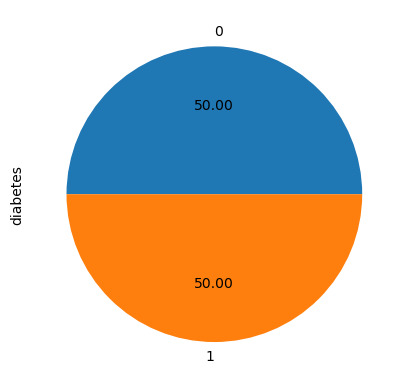

In [125]:
Y_resOS.value_counts().plot.pie(autopct='%.2f') # 1 para diabético, 0 par não diabético

In [126]:
Y_resOS.value_counts()

0    58673
1    58673
Name: diabetes, dtype: int64

In [127]:

clf2=LogisticRegression(random_state=0, max_iter=500)
#Fazendo o fit dos dados
clf2=clf2.fit(X_resOS,Y_resOS)
#Previsão com os dados de teste

Y_pred2=clf2.predict(X_test)


In [128]:
recall_score(Y_test,Y_pred2)

0.8717948717948718

In [129]:
confusion_matrix(Y_test, Y_pred2)

array([[25666,  3234],
       [  355,  2414]])

# Arvore de decisão

In [130]:
clfAD2 = DecisionTreeClassifier(random_state=0)
clfAD2= clfAD2.fit(X_resOS, Y_resOS)
Y_predAD2 = clfAD2.predict(X_test)

In [131]:
recall_score(Y_test,Y_predAD2)

0.7323943661971831